

---

### Topic 1: Introduction to Word Embeddings & Word2Vec

#### 1. Introduction
**What it is:** Word embedding is a technique used to represent words as numbers (specifically, vectors) so that machines and algorithms can understand and process them. Since computers cannot work directly with text (like "king" or "queen"), we need to convert words into a numerical format.

**Why it is important:** This conversion is the foundation for many natural language processing (NLP) tasks. It allows us to perform mathematical operations on words, such as finding similar words or even solving analogies (e.g., "King is to Man as Queen is to Woman").

**Real-life use:** Search engines, recommendation systems, and chatbots all use word embeddings to understand the meaning and context of the words you use.

#### 2. Detailed Explanation
The transcript explains that there are two main families of techniques for converting words to numbers:

1.  **Frequency-Based:** This approach decides the vector based on the count or frequency of words.
    - **Examples:** Bag of Words (BOW), TF-IDF, and GloVe.

2.  **Prediction-Based:** This approach converts words to vectors based on a prediction algorithm. This is where **deep learning** and **neural networks** are used. **Word2Vec is a prediction-based technique.**

**What is Word2Vec Specifically?**
Word2Vec is a word embedding technique created by a Google engineer in 2013. Its job is to convert words into a collection of numbers (a vector).
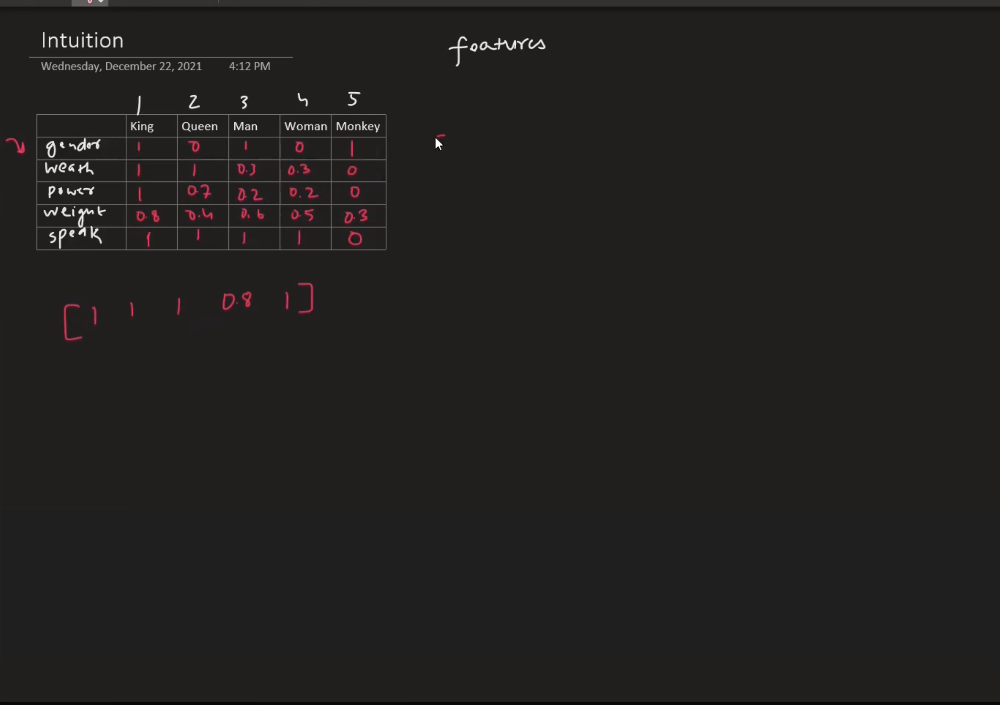


**Key Advantages of Word2Vec over older techniques (like Bag of Words):**
| Feature | Word2Vec | Older Methods (e.g., Bag of Words) |
| :--- | :--- | :--- |
| **Semantic Meaning** | **Captures the meaning** of words. It can identify that "happy" and "joyful" are similar. | Could not capture such relationships. |
| **Vector Size** | **Low-dimensional** vectors. Each word is represented by a small set of numbers (e.g., 300 numbers). | **High-dimensional** vectors. Often had a dimension for every word in the vocabulary, making them huge. |
| **Sparsity** | **Dense vectors**. Most of the numbers in the vector are non-zero values. | **Sparse vectors**. Most of the numbers in the vector were zero, leading to inefficiency and overfitting. |

#### 3. Key Points
- Word2Vec converts a word into a vector of numbers.
- It is a **prediction-based** technique, typically using neural networks.
- Its main advantages are capturing **semantic meaning**, being **low-dimensional**, and creating **dense** vectors.
- It was introduced by a Google engineer.

#### 7. Common Mistakes
- **Confusing "words" with "vectors":** Remember, a word itself is not a vector. Word2Vec is the *process* that creates a numerical representation (the vector) for a word.
- **Thinking all embeddings are the same:** Not all word-to-vector techniques are Word2Vec. There are frequency-based ones (like Bag of Words) which are much simpler and less powerful.

#### 8. Interview/Exam Questions
**Q: What are the main advantages of Word2Vec compared to a simple Bag of Words model?**
**A:** Word2Vec captures the semantic meaning of words, allowing it to find similar words. It creates dense, low-dimensional vectors, which makes computation faster and avoids the overfitting and sparsity problems (many zeros) of high-dimensional Bag of Words vectors.

#### 9. Revision Notes
- Word2Vec is a **prediction-based** word embedding technique.
- It creates **dense, low-dimensional** vectors for words.
- It is superior to frequency-based methods because it captures **semantic meaning**.

---



## Visualization
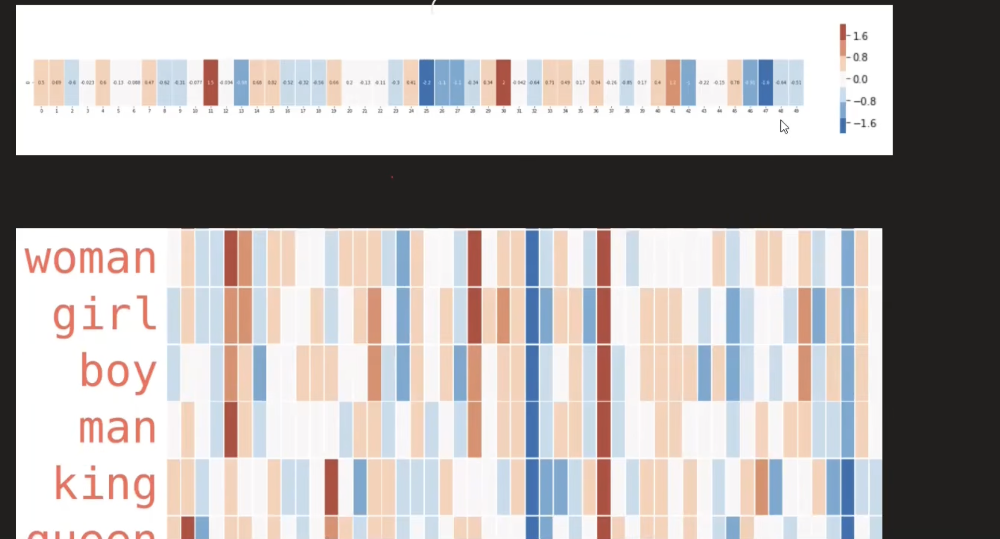

### Topic 2: How Word2Vec Works - The Core Intuition and Neural Network Approach

#### 1. Introduction
Now that we know *what* Word2Vec is, we need to understand *how* it actually works. The core idea is based on a simple observation: "Words that are used in similar contexts tend to have similar meanings." Word2Vec uses this principle to learn the vector representation of words. This is achieved by creating a "dummy" problem and solving it using a neural network, where the vectors are a byproduct of the solution.

#### 2. Detailed Explanation

**The Core Intuition: "You shall know a word by the company it keeps."**
Word2Vec's logic is simple: if two words appear in the same context (e.g., next to the same words), they should have similar vector representations. For example, the words "football" and "hockey" will often appear in the same context (e.g., "player," "game," "stadium"), so their vectors will be similar. This is different from a word like "cricket," which might have a different context.

**The "Dummy Problem" Concept**
This is a crucial idea. Word2Vec does not directly convert a word to a vector. Instead, it creates an artificial problem (a dummy problem). To solve this problem, the neural network is forced to learn features about the words, and the resulting features *are* the vectors.

- **The Problem:** We create a "Contact" based problem.
- **The Goal:** We want to predict a word given its surrounding words, or vice-versa.

**Step-by-Step Walkthrough (Example)**
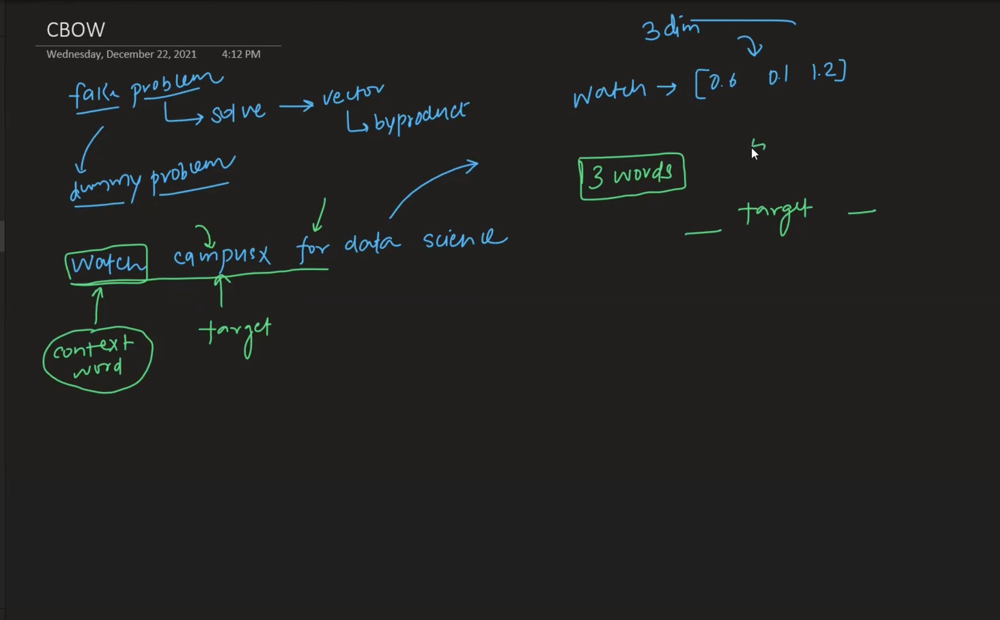
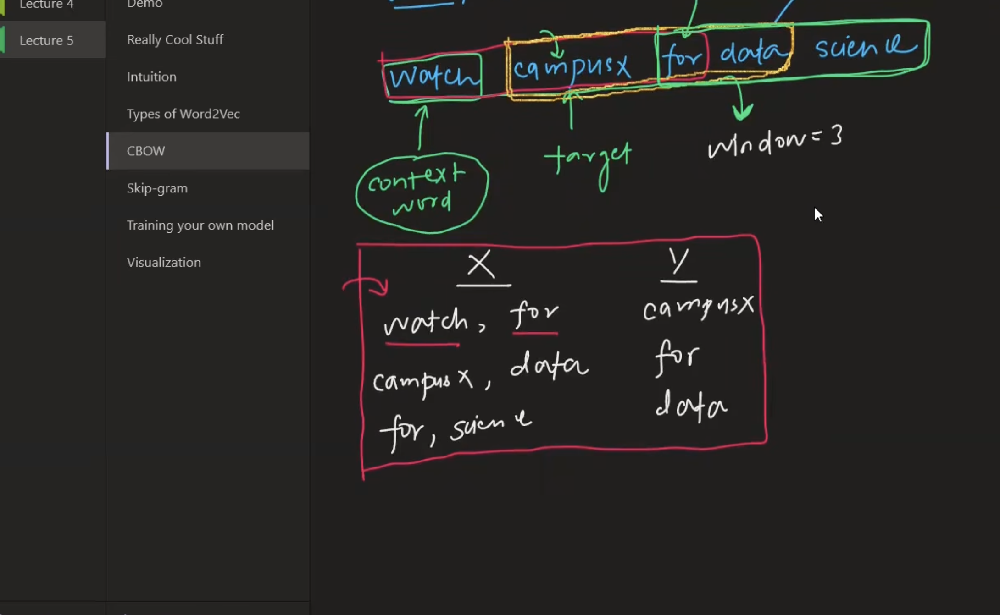
Imagine you have a corpus with only five words: *watch, cameras, phone, data, science*.

1.  **Create a Window:** You decide to look at a "window" of 3 words.
    - Example sentence: "watch cameras phone data science"
    - Window 1: **[watch, cameras, phone]**
    - Window 2: **[cameras, phone, data]**
    - Window 3: **[phone, data, science]**

2.  **Define Target and Context Words:**
    - In the window **[watch, cameras, phone]**, the **target word** (the middle one) is "cameras." The **context words** are "watch" and "phone."

3.  **Form the Dummy Problem:** You create training data from these windows.
    - **Example (for window 1):** You give the network the *context* words ["watch", "phone"] and ask it to predict the *target* word ["cameras"]. This is the CBOW architecture.
    - **Alternative (for window 1):** You give the network the *target* word ["cameras"] and ask it to predict the *context* words ["watch", "phone"]. This is the Skip-gram architecture.

**How the Neural Network Extracts Vectors**
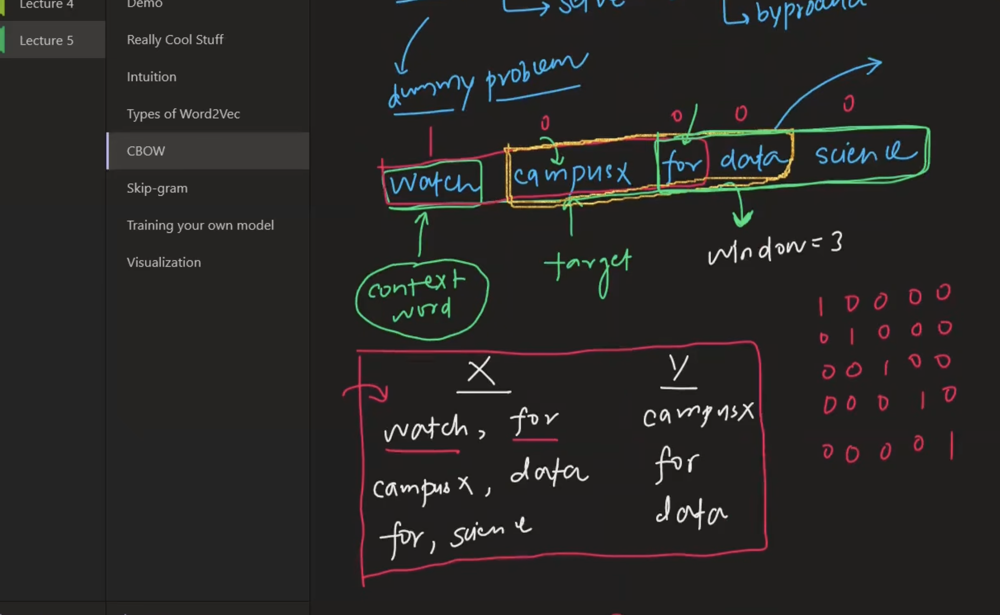
1.  **Input Encoding:** The words are first turned into a one-hot encoded vector. If your vocabulary has 5 words, each word is represented by a vector of length 5 with a single '1' at its position (e.g., "watch" = [1,0,0,0,0], "cameras" = [0,1,0,0,0]).

2.  **The Network Architecture:** A shallow neural network is used.
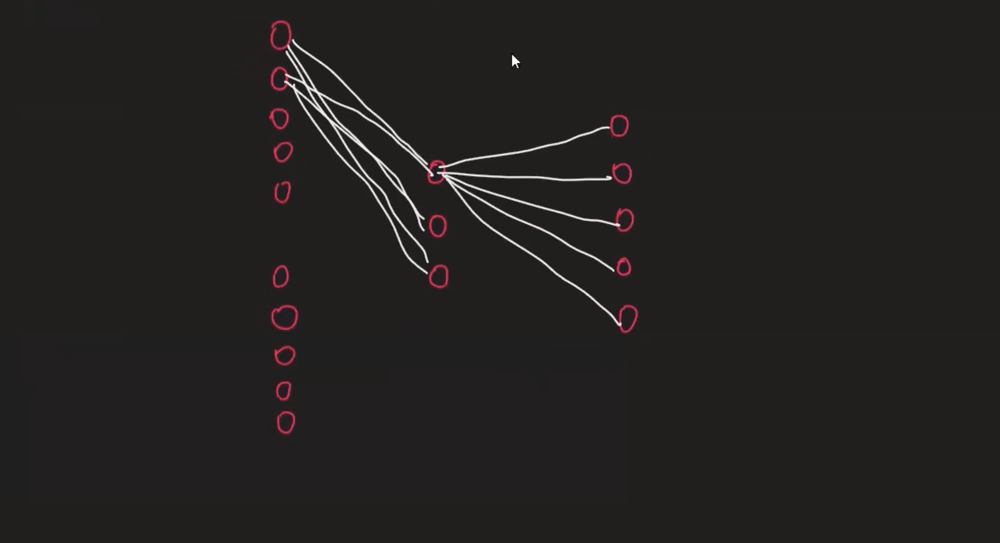
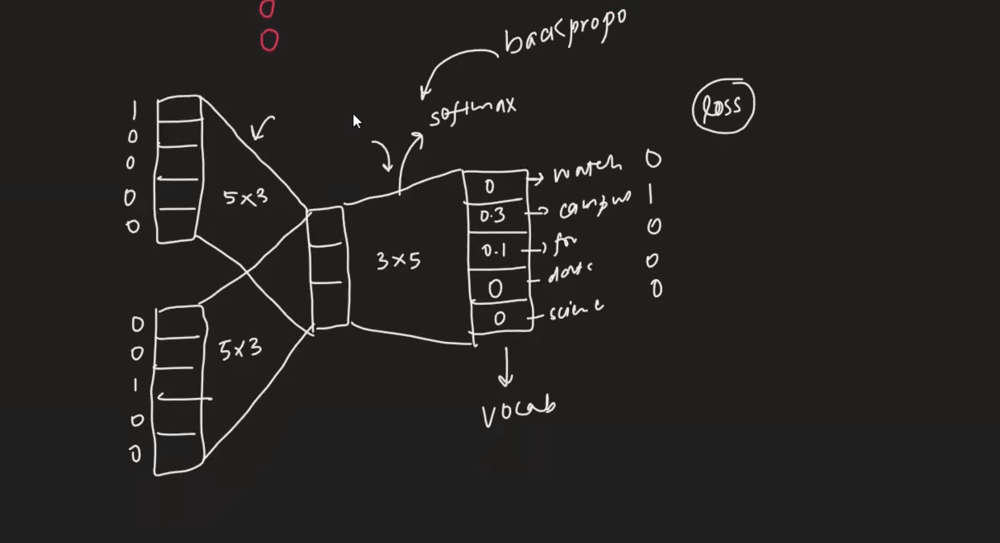

    - **Input Layer:** Takes the one-hot encoded vector(s).
    - **Hidden Layer:** The weights connecting the input and hidden layers are the key. This is a small layer (e.g., 3 nodes if you want a 3-dimensional vector).
    - **Output Layer:** Predicts the word(s). The size of this layer is the size of the vocabulary (5 in this example).

3.  **Training Process:**
    - The network weights are randomly initialized.
    - A training sample (input and expected output) is passed.
    - The network makes a prediction (e.g., the output layer gives a probability for each word).
    - The prediction is compared to the expected output, and a "loss" is calculated (how wrong the network was).
    - The network adjusts its weights to reduce this loss using a process called backpropagation.
    - This is repeated for millions of training samples over many "epochs" until the loss is minimized.

4.  **The Byproduct (The Vector):**
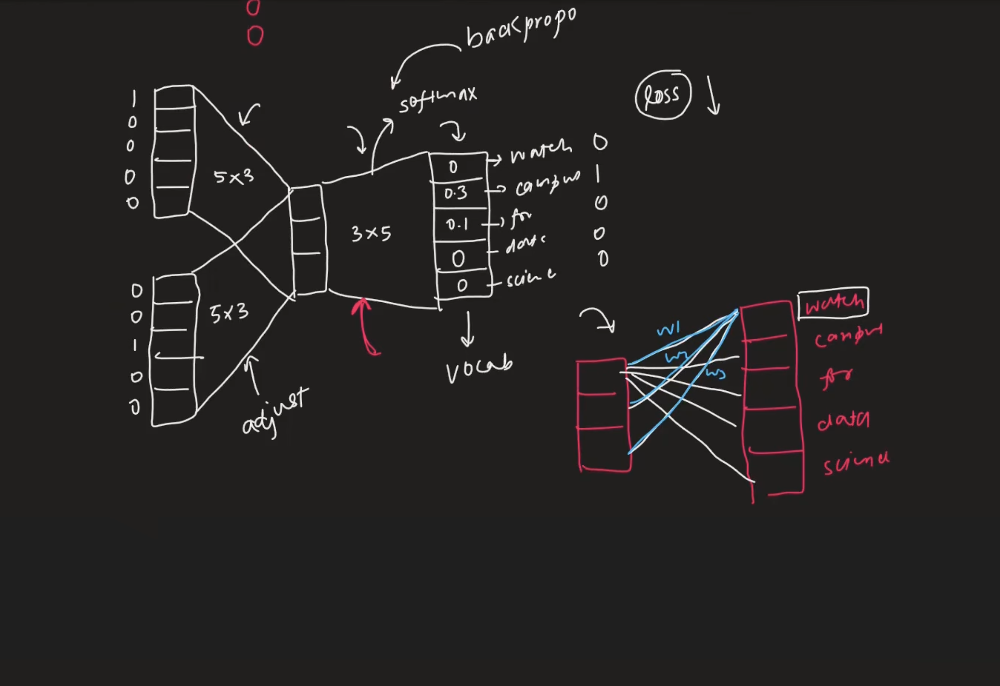
 Once the training is complete, the weights of the neural network have been optimized. These weights *are* the vector representation for the words.
    - For example, the weights connecting the input node for "watch" to the hidden layer become the vector for "watch" [w1, w2, w3].
    - Similarly, the weights for "cameras" become its vector [c1, c2, c3].

#### 3. Key Points
- Word2Vec's core logic is that similar words appear in similar contexts.
- It works by creating an artificial (dummy) problem and solving it.
- The word vectors are not directly created; they are a **byproduct** of the neural network training process.
- A neural network has an input layer, a hidden layer (which determines the vector size), and an output layer.
- The weights of the network, after training, become the word vectors.

#### 7. Common Mistakes
- **Thinking vectors are created directly:** Many beginners think Word2Vec is a simple lookup table. It's not. The vectors are *learned* during the training of a neural network.
- **Ignoring the "dummy problem":** Understanding that the problem (predicting context from a word, or vice-versa) is artificial is key to understanding why the network learns anything useful. It learns the features of words because it must to solve the prediction problem.

#### 8. Interview/Exam Questions
**Q: How does the Word2Vec model get the vector representation for a word?**
**A:** The vector is a byproduct of training a neural network on an artificial problem. The network takes one-hot encoded words and tries to predict context words or vice-versa. During training, the network learns weights. Once the training is complete, the weights from the input layer to the hidden layer are used as the vector representation for that specific word.

#### 9. Revision Notes
- **Core Logic:** Words in similar contexts have similar meanings.
- **The Vector:** A byproduct of solving a prediction problem with a neural network.
- **Process:** One-hot encoding → Neural Network → Weights become Word Vectors.

---



### Topic 3: The Two Architectures - CBOW and Skip-gram

#### 1. Introduction
Word2Vec is not a single algorithm but comes in two distinct flavors or architectures: **Continuous Bag of Words (CBOW)** and **Skip-gram**. Both are shallow neural networks, but they have opposite ways of using the context and target words to learn. Understanding the difference is crucial for knowing when to use which.

#### 2. Detailed Explanation

The fundamental difference between CBOW and Skip-gram lies in the direction of the prediction.

**1. Continuous Bag of Words (CBOW)**
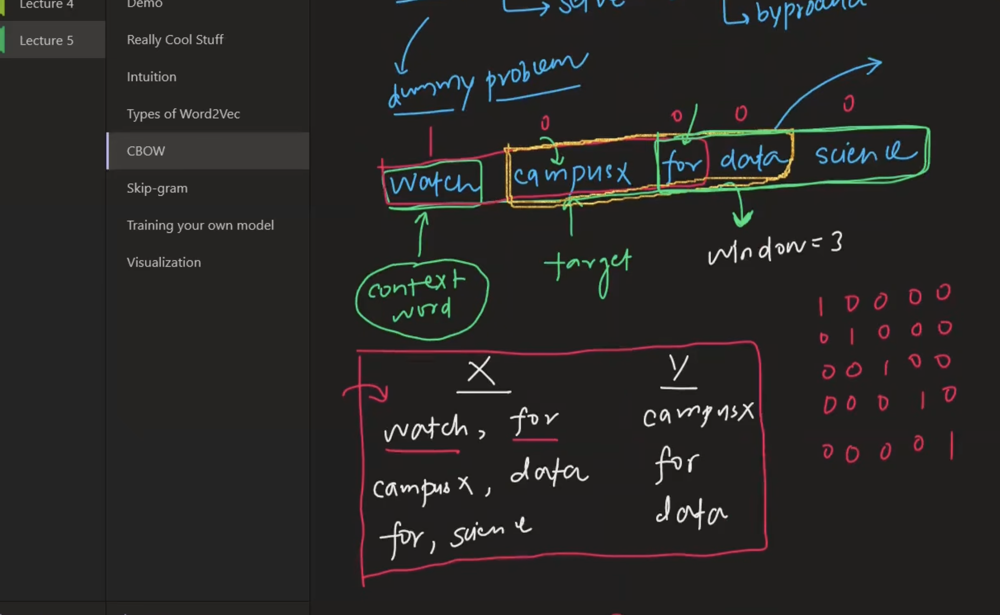
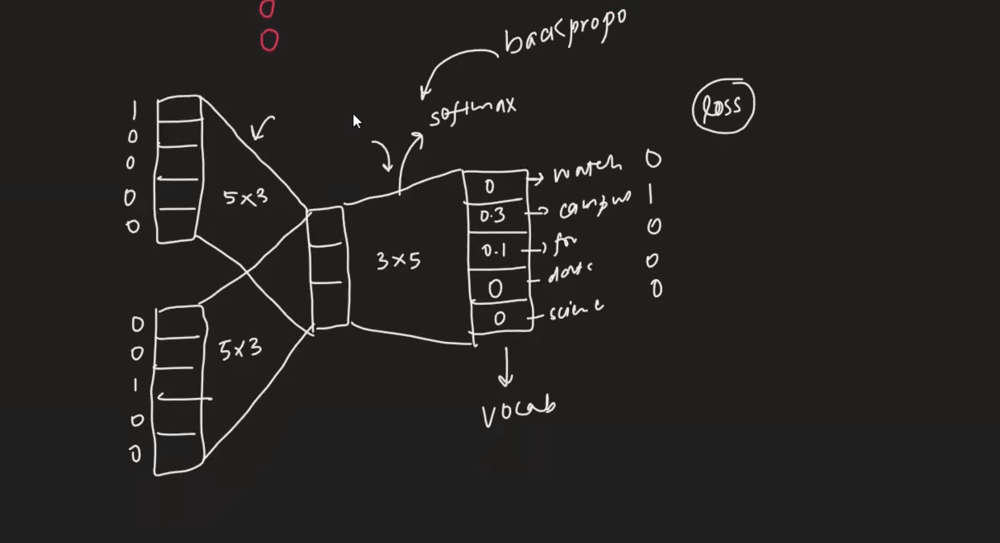
- **How it works:** CBOW predicts the *target* word from the *context* words. It looks at the context (surrounding words) and tries to guess the middle word.
- **Analogy:** Imagine you have a sentence with a blank: "The cat sat on the ___." CBOW is the model that looks at all the context words ("The", "cat", "sat", "on", "the") and tries to fill in the blank with the most likely target word, which is "mat".
- **Input & Output:** The input is the context words, and the output is the target word.

**2. Skip-gram**
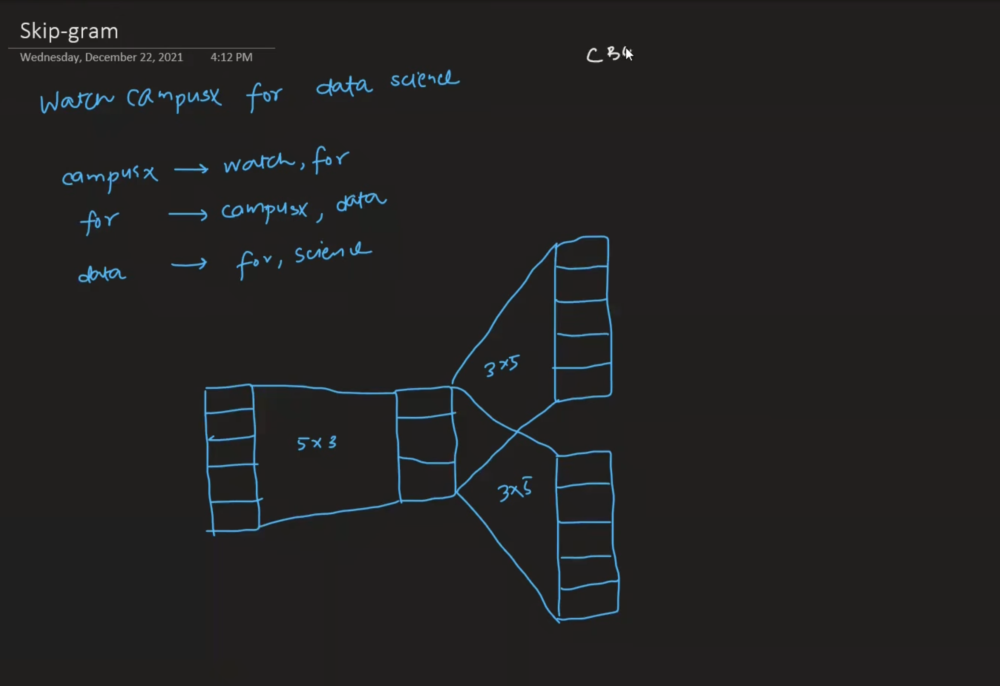
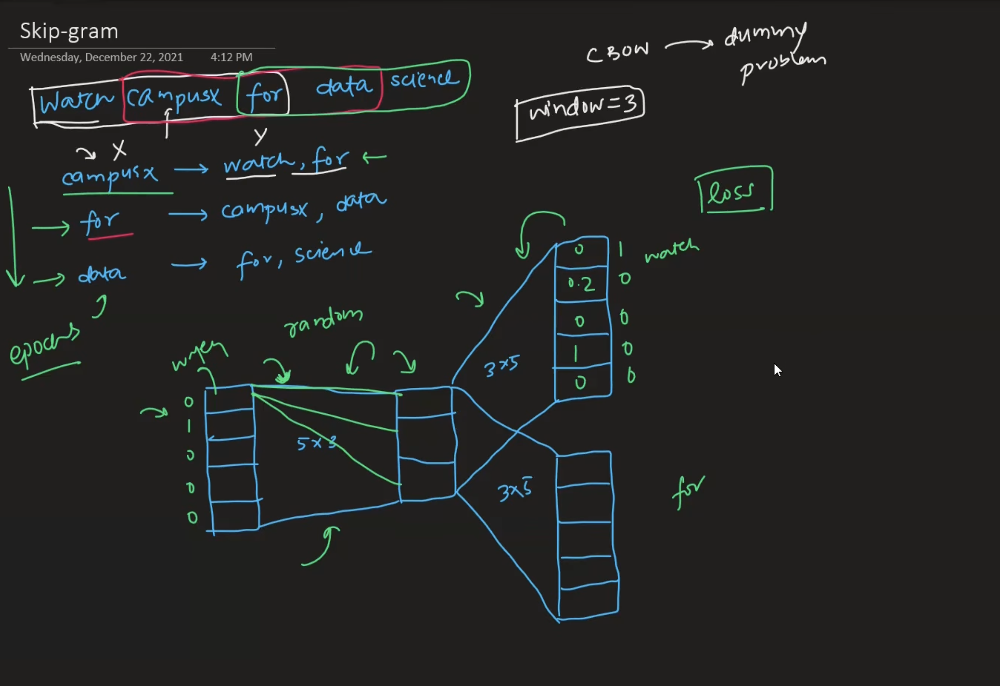
- **How it works:** Skip-gram does the exact opposite. It predicts the *context* words from a given *target* word. You give it one word, and it tries to guess the words that usually appear around it.
- **Analogy:** If I give you the word "apple," Skip-gram tries to predict words like "fruit," "eat," "juice," or "red."
- **Input & Output:** The input is the target word, and the output is the context words.

**Visualizing the Architectures (Based on the Transcript)**

Using the example sentence *watch cameras phone data science* and a window size of 3:

| Feature | **CBOW** | **Skip-gram** |
| :--- | :--- | :--- |
| **The Problem** | Given **Context Words**, predict **Target Word**. | Given **Target Word**, predict **Context Words**. |
| **Window Example** | Input: ["watch", "phone"] → Output: ["cameras"] | Input: ["cameras"] → Output: ["watch", "phone"] |
| **Network Shape (Simplified)** | Input layer (multiple words) → Hidden → Output (single word) | Input layer (single word) → Hidden → Output (multiple words) |
| **Best Used For** | Smaller datasets. It is faster and works well when you have a lot of training data. | Larger datasets. It is slower but tends to give better results for rare words and in large-scale research. |

**When to Use Which (A Crucial Insight)**
The transcript gives a very practical rule of thumb for an interview setting:
- If you are working with **smaller data**, use **CBOW**.
- If you are working with **larger data**, use **Skip-gram** as it tends to give better results for rare words.

#### 3. Key Points
- CBOW predicts a word based on its context.
- Skip-gram predicts the context based on a word.
- Both use the same fundamental neural network logic but with reversed input and output.
- CBOW is faster but Skip-gram tends to perform better with large datasets.

#### 7. Common Mistakes
- **Confusing which predicts which:** Remember: **CBOW** uses the **Context** to predict the **word**. **Skip-gram** uses the **word** to **Skip** to the context. Using the acronym can help: C for Context, S for Skip.
- **Thinking one is always superior:** The best architecture depends on your data. For most simple, smaller projects, CBOW is efficient. For large, complex tasks, Skip-gram is often the better choice.

#### 8. Interview/Exam Questions
**Q: Can you explain the difference between CBOW and Skip-gram and when you would use each?**
**A:** CBOW (Continuous Bag of Words) predicts a target word from its surrounding context. It is faster and better for smaller datasets. Skip-gram does the opposite: it predicts the context words from a given target word. It is slower but often gives better results, especially for rare words, making it the preferred choice for large datasets and research.

#### 9. Revision Notes
- **CBOW:** Context → Predicts Target Word. (Small data, fast)
- **Skip-gram:** Target Word → Predicts Context. (Large data, better performance)
- **Both:** Are shallow neural networks.

---



### Topic 4: Practical Demonstration - Using a Pre-trained Word2Vec Model

#### 1. Introduction
Before training your own model, it's incredibly useful to use a pre-trained one. Google has trained a Word2Vec model on a massive dataset of 3 billion words from Google News. This model contains vector representations for 3 million words and phrases. Using it allows you to immediately explore the power of Word2Vec without spending hours training on your own computer. This is the first demonstration shown in the transcript.

#### 2. Detailed Explanation

**The Pre-trained Model**
- **Dataset:** Trained on Google News data containing approximately **3 billion words**.
- **Vocabulary:** Contains **3 million** words and phrases.
- **Vector Size:** Each word is represented by a **300-dimensional** vector. (The vector is a list of 300 numbers).

**How to Use It (Python with Gensim Library)**
The transcript uses the `gensim` library to load and interact with the model.

1.  **Import and Load:**
    - You need to download the pre-trained model file (approx. 1.5 GB) from a URL.
    - You then import the `KeyedVectors` module from `gensim` to load the file. The loaded object (often named `model`) now contains all the 3 million word vectors.

2.  **Exploring the Model - The "Similarity" Function:**
    - You can find the most similar words to a given word. The model converts your input word into its 300-dimensional vector and then finds other vectors in its vocabulary that are closest to it (based on distance/cosine similarity).
    - **Example (Man):** When you ask for words similar to "man", the model returns a list like:
        - `man` (itself, similarity 1.0)
        - `men` (0.76)
        - `teenager` (0.67)
        - `teenage girl` (0.60)
        - *The transcript notes that some results might be unexpected due to the specific dataset (Google News) and its content.*

3.  **Exploring the Model - The "Doesn't Match" Function:**
    - This function identifies which word in a list is the odd one out.
    - **Example:** `model.doesnt_match(["PHP", "Java", "Python"])` would correctly identify the odd one out, even though the transcript's example was different.

4.  **The Magic of Vector Arithmetic:**
    - This is where Word2Vec becomes truly powerful. Because words are vectors, you can perform mathematical operations on them.
    - **Analogy Solving:** The classic example is: `King - Man + Woman = ?`
        1.  It takes the vector for "King".
        2.  Subtracts the vector for "Man".
        3.  Adds the vector for "Woman".
        4.  The resulting vector is then compared to all other word vectors to find the closest match.
    - **Result:** The model outputs "Queen" as the answer. Other similar results like "Princess" and "Ruler" also appear.
    - **Another Example:** `INR - India + England = ?` (INR is the currency of India). The result is "Great Britain Pound" (GBP), the currency of England.

#### 3. Key Points
- Pre-trained models (like the one on Google News) allow you to use Word2Vec instantly.
- The model represents each word as a 300-dimensional vector.
- The `most_similar` function finds words with the most similar vectors.
- Vector arithmetic (e.g., `King - Man + Woman`) can solve analogies and find relationships between words.

#### 5. Code Examples (Commented)
```python
# Import the necessary module from the Gensim library
from gensim.models import KeyedVectors

# Load the pre-trained Google News model (You need to download this file first)
# model = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)

# 1. Find the most similar words to "cricket"
# similar_words = model.most_similar("cricket")
# print("Words similar to 'cricket':", similar_words)
# This would return a list of tuples: ('cricketing', 0.78), ('cricketer', 0.76), etc.

# 2. Find the odd one out in a list
# odd_word = model.doesnt_match(["PHP", "Java", "Python"])
# print("The odd one out is:", odd_word)  # Output: PHP

# 3. Perform vector arithmetic
# result = model.most_similar(positive=['king', 'woman'], negative=['man'], topn=5)
# print("King - Man + Woman =", result)
# The top result will be 'queen', followed by 'princess', etc.
```

#### 6. Output (Explanation of Code Example 3)
- **Input:** `model.most_similar(positive=['king', 'woman'], negative=['man'])`
- **What it means:** Find the vector for `king`, add the vector for `woman`, subtract the vector for `man`. Then, find the word vectors closest to this resulting vector.
- **Output:** `[('queen', 0.85), ('princess', 0.78), ('ruler', 0.74), ...]`
- **Explanation:** The mathematical operation yielded a vector that is semantically closest to "Queen."

#### 7. Common Mistakes
- **Expecting perfect results:** The model is only as good as the data it was trained on. If the data is biased, the results can be biased or produce unexpected outputs.
- **Forgetting to download the model:** The 1.5 GB pre-trained model is not included in the library by default. You must download it separately.
- **Misunderstanding `most_similar` output:** The function returns a list of tuples. The first element is the word, and the second is the similarity score (a number between -1 and 1, where 1 is the closest).

#### 9. Revision Notes
- Use the **`gensim`** library to work with pre-trained models.
- **`model.most_similar("word")`** finds related words.
- **`model.doesnt_match(["word1", "word2"])`** finds the odd word out.
- **`model.most_similar(positive=['word'], negative=['word'])`** performs vector math.

---



### Topic 5: Training Your Own Word2Vec Model - A Hands-On Case Study (Game of Thrones)

#### 1. Introduction
While pre-trained models are great, they might not capture the specific vocabulary and context of your domain. For example, a pre-trained model on news articles won't understand the unique relationships between characters in "Game of Thrones" (e.g., "Stark," "Lannister," "Winterfell"). The transcript provides a step-by-step guide on how to train a Word2Vec model from scratch on a custom dataset.

#### 2. Detailed Explanation

**The Goal**
To train a Word2Vec model on the entire text of the "Game of Thrones" books (all five books) to learn relationships between characters and events specific to that universe.

**Step-by-Step Process Using Python and Gensim**

**Step 1: Data Collection & Loading**
- **The Data:** The dataset consists of five text files, one for each book.
- **Loading:** You create a folder (e.g., `data`) and place all five text files inside it.
- **Code Logic:** A loop reads each file line by line, storing all the content (the corpus) into a single large string variable.

**Step 2: Data Preprocessing**
- **Tokenization:** Raw text needs to be broken down into sentences and words. The `gensim` library provides a function (`gensim.models.word2vec.LineSentence` or similar) to read a file and break it down into a list of sentences.
- **Processing:** For each sentence, you can apply a basic preprocessing function (provided by the `gensim` library) to clean it up (e.g., remove unnecessary punctuation, convert to lowercase).
- **Result:** The output is a list of sentences (`sentences`). Each sentence is itself a list of words. For the Game of Thrones dataset, this resulted in roughly **15,500 sentences**.

**Step 3: Building and Training the Model**
- **Instantiate the Model:** You create a Word2Vec model object by providing parameters:
    - `window`: The size of the context window. `window=2` means you look at 2 words on either side of the target word.
    - `vector_size`: The number of dimensions for your word vectors. `vector_size=100` means each word will be represented by a 100-number vector.
    - `workers`: (Optional) The number of CPU threads to use for faster training.
- **Build Vocabulary:** The model scans your `sentences` list to identify all unique words and builds a vocabulary.
- **Train the Model:** This is the most time-consuming step. The model trains on your corpus, adjusting its weights to learn the vector representations. The `epochs` parameter controls how many times the model goes through the entire dataset.

**Step 4: Using the Trained Model**
Once trained, you can use the model just like the pre-trained one:

- **Find Similar Words:**
    - `model.wv.most_similar("Stark")` might return "Bolton", "Lannister", "Greyjoy".
    - `model.wv.most_similar("winter")` might return "cold", "iscoming", "fell".
- **Find the Odd Word Out:**
    - `model.wv.doesnt_match(["Jon", "Arya", "Sansa", "Cersei"])` would likely return "Cersei" as she is a Lannister, not a Stark.
- **Get a Word's Vector:**
    - `model.wv['Arya']` returns the 100-number vector for "Arya".
- **Calculate Similarity:**
    - `model.wv.similarity('Arya', 'Sansa')` will return a high similarity score (e.g., 0.85), correctly capturing that they are sisters.

#### 3. Key Points
- Training a model on a specific domain (like Game of Thrones) gives you vectors that are tailored to that domain.
- The process involves: **Loading data → Preprocessing → Building the model → Training**.
- Two of the most important parameters are **`vector_size`** (the number of dimensions) and **`window`** (the context size).
- After training, all the standard Word2Vec functions (`most_similar`, `similarity`, `doesnt_match`) work on the trained model.

#### 5. Code Examples (Commented)
```python
from gensim.models import Word2Vec
import os

# Step 1: Load Data - Assume 'data' folder has the text files
# sentences = []
# for file in os.listdir('data'):
#     with open(os.path.join('data', file), 'r') as f:
#         content = f.read()
#         # Tokenize the text into a list of sentences, each a list of words
#         # (Using a simplified approach for clarity)
#         processed_sentences = [sentence.split() for sentence in content.split('.')]
#         sentences.extend(processed_sentences)

# Step 2: Build and Train the Model
# model = Word2Vec(
#     sentences=sentences,
#     window=2,          # Context window size
#     vector_size=100,   # Number of dimensions for the vectors
#     min_count=5,       # Ignore words that appear less than 5 times
#     workers=4,         # Use 4 CPU cores
#     epochs=50          # Number of times to pass through the data
# )

# Step 3: Use the Trained Model
# print("Words similar to 'Stark':", model.wv.most_similar('Stark'))
# print("Similarity between Arya and Sansa:", model.wv.similarity('Arya', 'Sansa'))
# print("Odd one out:", model.wv.doesnt_match(['Arya', 'Sansa', 'Cersei']))
```

#### 6. Output (Example)
- `print(model.wv.most_similar('Stark'))` might output:
    `[('Bolton', 0.8), ('Lannister', 0.7), ('Greyjoy', 0.65)]`
- This shows that the model correctly learned that these are all major houses in the show.

#### 7. Common Mistakes
- **Not preprocessing properly:** Raw text contains punctuation and special characters that can confuse the model. Always clean your text.
- **Using a window size that is too large or too small:** A very small window might miss important context, while a very large one might introduce noise. The transcript suggests starting with a value between 2 and 5.
- **Ignoring `min_count`:** If your dataset is small, you might want to ignore words that appear only once or twice, as they don't provide enough context to learn a good vector.

#### 9. Revision Notes
- Custom models are great for domain-specific relationships.
- The training pipeline is: **Data -> Preprocessing -> Model (`Word2Vec`) -> Train (`model.train()`) -> Use**.
- Key hyperparameters: `window`, `vector_size`, `min_count`, `epochs`.

---



### Topic 6: Advanced Usage - Improving Models, Dimensionality Reduction, and Visualization

#### 1. Introduction
Once you have a trained Word2Vec model, you can go beyond simple similarity searches. This topic covers how to improve your model by adjusting parameters, and more importantly, how to visualize the high-dimensional word vectors to see relationships and clusters in a 2D or 3D space.

#### 2. Detailed Explanation

**1. Techniques to Improve Your Word2Vec Model**
The transcript mentions two key ways to get better results from your training:

- **Increase Vector Size (`vector_size`):** The default might be 100, but you can increase this to 200, 300, or more. A higher dimension can capture more nuanced relationships between words. However, larger vectors require more training data and computation time.
- **Increase Window Size (`window`):** Instead of looking at just 1 or 2 words on each side, you can increase the window to 3, 5, or more. This allows the model to capture longer-range dependencies. The trade-off is that a larger window can sometimes introduce noise and also increases training time.

**2. The Curse of High Dimensions & Dimensionality Reduction**
- **The Problem:** The vectors created by Word2Vec can have 100, 200, or even 300 dimensions. This is great for capturing meaning but impossible for humans to visualize directly. We cannot plot a 100-dimensional space.
- **The Solution (Dimensionality Reduction):** You can use techniques to reduce the number of dimensions from hundreds down to 2 or 3, while preserving the relative distances and relationships between the words. Two common techniques mentioned in the transcript are:
    - **PCA (Principal Component Analysis):** A classic, linear technique that finds the directions (principal components) with the most variance in the data and projects the data onto those new axes.
    - **t-SNE (t-Distributed Stochastic Neighbor Embedding):** A more modern, non-linear technique that is often better at preserving local structures (clusters of similar words) in the reduced space.

**3. Visualizing the Vectors**
Once you've reduced the dimensions, you can plot the words on a 2D or 3D graph. This visualization can reveal interesting patterns, like:
- Similar words forming clusters.
- Different topics or categories being spatially separated.

**Example from the Transcript (Game of Thrones):**
- After training the Game of Thrones model, the user reduced the 100-dimensional vectors to 3D using PCA.
- They plotted a subset of words (e.g., the top 100 words).
- **Results:**
    - The word "town" and "cities" were plotted close together.
    - "Sir" and "Lady" appeared in a similar region.
    - "Brother" and "Sister" were also placed near each other.
    - Character names from the same houses or with similar roles (e.g., "Arya" and "Sansa") were clustered together.
- This demonstrates that the Word2Vec model successfully learned the semantic relationships between these words and that these relationships are preserved even after reducing the vector space.

#### 3. Key Points
- **Tuning Parameters:** Adjusting `vector_size` and `window` can improve model performance.
- **Dimensionality Reduction:** Techniques like PCA and t-SNE are used to reduce high-dimensional vectors to a visualizable form (2D or 3D).
- **Visualization:** Plotting the reduced vectors reveals natural clusters of related words, proving that the model has captured semantic meaning.

#### 7. Common Mistakes
- **Not preprocessing the text before visualization:** Preprocessing steps like removing stop words ("the," "a," "is") can make the visualization much cleaner and more meaningful, as common but uninteresting words won't clutter the plot.
- **Thinking the visualization is the "truth":** The visualization is a simplification. The specific positions of words can vary depending on the dimensionality reduction technique and its parameters (like the `perplexity` in t-SNE).
- **Trying to plot all words:** With thousands of words, a plot becomes unreadable (a "hairball"). It's best to plot a subset of interesting words (e.g., character names, locations, key terms).

#### 8. Interview/Exam Questions
**Q: How can you visualize high-dimensional word vectors?**
**A:** You can use dimensionality reduction techniques like **PCA** (Principal Component Analysis) or **t-SNE** (t-Distributed Stochastic Neighbor Embedding) to reduce the vectors from hundreds of dimensions to 2 or 3 dimensions. You can then plot these reduced vectors on a scatter plot to see clusters of related words.

#### 9. Revision Notes
- **Improving models:** Increase `vector_size` and `window`.
- **Visualizing vectors:** Reduce dimensions using **PCA** or **t-SNE**.
- **Takeaway:** Visualization confirms that Word2Vec creates meaningful word clusters.

---



### Topic 7: Final Assignment and Course Wrap-Up

#### 1. Introduction
To solidify your understanding of Word2Vec, the best way is to get hands-on experience. The transcript concludes with a practical assignment and some final thoughts. This topic outlines the assignment and provides a recap of the entire learning journey.

#### 2. Detailed Explanation

**The Assignment**
The instructor gives a simple but effective assignment to apply everything you've learned:

- **Task:** Pick any text data that you find interesting. It could be a script from your favorite TV show, a book, a collection of news articles, or any other substantial text.
- **Goal:** Train a Word2Vec model on that dataset.
- **Explore:** Once your model is trained, experiment with all the functions you've learned:
    - Find the most similar words (`most_similar`).
    - Find the odd word out (`doesnt_match`).
    - Perform vector arithmetic (analogies).
    - If you are comfortable, try to visualize the vectors using PCA or t-SNE.
- **Purpose:** This is not a stressful test but an opportunity for discovery. By applying the concepts to your own data, you will see how Word2Vec captures domain-specific relationships and you will understand the nuances of the technique much better.

**Final Recap and Key Takeaways**
The core learning journey of this course, as presented in the transcript, is:

1.  **Introduction to Embeddings:** You learned that words need to be converted to numbers (vectors) for machines to understand them.
2.  **Word2Vec vs. Old Methods:** You understood the advantages of Word2Vec (captures meaning, dense vectors, low-dimensional) over older, frequency-based methods like Bag of Words.
3.  **The Core Intuition:** You grasped the "dummy problem" concept, where the vectors are a byproduct of training a neural network on a prediction task.
4.  **CBOW vs. Skip-gram:** You learned the two architectures and when to use which.
5.  **Using Pre-trained Models:** You saw how to leverage powerful, pre-trained models (like the one from Google News) for immediate results.
6.  **Training Your Own Model:** You walked through the entire process of training a custom model on a new dataset (Game of Thrones).
7.  **Visualization:** You learned about dimensionality reduction (PCA, t-SNE) to visualize the high-dimensional vectors and confirm they capture meaning.

#### 3. Key Points
- The best way to learn is to **apply** the concepts to your own data.
- The course covered a complete pipeline: from understanding the theory to implementing a custom model and visualizing the results.
- Word2Vec is a powerful tool for capturing semantic meaning and relationships between words.

#### 8. Interview/Exam Questions (Final Review)
**Q: Summarize the complete process of how to get word vectors from your own dataset using Word2Vec.**
**A:** 
1.  **Load and Preprocess:** Load your text data, clean it (remove punctuation, etc.), and tokenize it into a list of sentences, where each sentence is a list of words.
2.  **Instantiate the Model:** Create a `Word2Vec` object from the `gensim` library, specifying key parameters like `window` (context size) and `vector_size` (number of dimensions).
3.  **Build Vocabulary:** Use the model to scan your sentences and build a vocabulary.
4.  **Train the Model:** Train the model on your data, adjusting hyperparameters like `epochs`.
5.  **Use the Model:** Save your trained model and use it for tasks like finding most similar words, finding the odd one out, and solving analogies using vector arithmetic.

#### 9. Revision Notes (Complete Course Recap)
| Topic | Key Concept |
| :--- | :--- |
| **Goal** | Convert words into numbers (vectors). |
| **Word2Vec** | A prediction-based technique to get dense, low-dimensional vectors. |
| **Core Logic** | Words in similar contexts have similar vectors. |
| **How it Works** | A byproduct of training a neural network on a dummy prediction problem. |
| **Architectures** | **CBOW** (predict word from context) and **Skip-gram** (predict context from word). |
| **Usage** | Use pre-trained models or train your own with `gensim`. |
| **Visualization** | Use PCA or t-SNE to reduce dimensions for plotting. |
| **Action** | **The best way to learn is to practice!** |

---

**This concludes all topics from the transcript. You have now covered the entire course material.**